<a href="https://colab.research.google.com/github/wagnerscerqueira/analise_airbnb_florenca/blob/main/Analyzing_Airbnb's_Data_Florence.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://sigmoidal.ai">
  <img alt="Data Science na Prática 3.0" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">
</a>

# **Airbnb Data Analysis - Florence**
*Wagner Cerqueira*

---

<br>Airbnb is already considered the **largest hotel company today**. And the thing is, it **doesn't own any hotels!**

By connecting people who want to travel (and stay) with hosts who want to rent their properties in a practical way, Airbnb provides an innovative platform to create this alternative accommodation.

By the end of 2021, Airbnb, founded in 2008, had already hosted **more than 1 billion** people around the world, challenging traditional hotel chains.

One of Airbnb's initiatives is to make data from its platform available for some of the world's major cities. Through the [Inside Airbnb](http://insideairbnb.com) portal, it is possible to download a large amount of data to develop Data Science projects and solutions.
<br><br>
<center>
  <a href="https://www.airbnb.com.br/">
    <img alt="Airbnb's site" width="300px" src="https://raw.githubusercontent.com/wagnerscerqueira/analise_airbnb_florenca/main/img/Airbnb-Logo.jpg">
  </a>
</center>

## **Objective**

In this project, data from the city of Florence, Italy, will be analyzed to see what insights can be extracted from raw data, considering the following hypothetical situation:

A person is planning a vacation and would like to spend as much time as possible in Florence. In which properties could this person stay for up to 30 days? What is the average price in the city? Which district is the most expensive, which is the cheapest?

Although this is a superficial analysis, it will be possible to see the amount of information that can be extracted from the data.

## **About the city**

[**Florence**](https://en.wikipedia.org/wiki/Florence) is a city in north-central Italy and the capital of the Tuscany region. It is the most populous city in Tuscany, with 366,000 inhabitants, and is about 170 mi (270 km) from Rome.

Florence was a center of commerce and finance in medieval Europe and one of the wealthiest cities of that era. It is considered by many scholars to be the birthplace of the Renaissance, becoming an important artistic, cultural, commercial, political, economic, and financial center. During this time, Florence achieved a position of enormous influence in Italy, Europe, and beyond. Its turbulent political history includes periods of rule by the powerful Medici family and numerous religious and republican revolutions. From 1865 to 1871 the city served as the capital of the Kingdom of Italy (established in 1861). The Florentine dialect forms the basis of standard Italian and became the language of culture throughout Italy due to the prestige of the masterpieces of **Dante Alighieri**, **Petrarch**, **Giovanni Boccaccio**, **Niccolo Machiavelli** and **Francesco Guicciardini**.

The city attracts millions of tourists every year, and UNESCO declared the Historic Center of Florence a World Heritage Site in 1982. The city is known for its culture, Renaissance art, architecture, and monuments. The city also contains numerous museums and art galleries, such as the Uffizi Gallery and the Pitti Palace, and still exerts influence in the fields of art, culture, and politics. Due to Florence's artistic and architectural heritage, Forbes ranked it as the most beautiful city in the world.

Florence plays an important role in Italian fashion and is ranked among the top 15 fashion capitals in the world by the Global Language Monitor; in addition, it is an important national economic center, as well as a tourist and industrial center.

<center><img alt="Florence, Italy" width="500 px" src="https://raw.githubusercontent.com/wagnerscerqueira/analise_airbnb_florenca/main/img/Florence-Tuscany.jpg"></center>

## **Data Obtainment**

All data used was obtained from the website [Inside Airbnb](http://insideairbnb.com/get-the-data.html). On this website, you can find several files about various cities around the world. For this initial exploratory analysis, only the following file will be downloaded:

* `listings.csv` - *Summary information and metrics for listings in Florence (good for visualisations).*

For more detailed analyses, the file `listings.csv.gz` contains 74 variables for each of the properties advertised and should be used.

The data analyzed below was compiled on 12/17/2021. Per Inside Airbnb's data policy, only the last 12 months of data will be made available for free consultation, so over time, the exact [dataset](http://data.insideairbnb.com/italy/toscana/florence/2021-12-17/visualisations/listings.csv) used in this project will no longer be available, making the code and analysis impossible.

Therefore, a copy of the dataset is stored [here](https://bit.ly/3IN1BD3) for future reference.

In [ ]:
# importing necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

%matplotlib inline

# importing the file listings.csv into a DataFrame
df = pd.read_csv('https://bit.ly/3IN1BD3')

## **Exploratory Analysis**

This step aims to create initial situational awareness and allow an understanding of how the data is structured. To do this, the appearance of the *dataset* will be checked based on the first 5 entries.

In [ ]:
# showing the first 5 entries
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78210,11.24392,Entire home/apt,70,2,1,2019-09-27,0.04,4,361,0,NaN
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,107,0,NaN
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,107,0,NaN
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,361,0,NaN
4,26738,N4U Guest House Florence,113883,N4U Guest House,NaN,Centro Storico,43.77017,11.25754,Private room,139,1,31,2019-07-03,0.22,2,347,0,NaN


Below is the **variables dictionary** present in the imported dataset:

* `id` - number generated to identify the property
* `name` - name of the advertised property
* `host_id` - identification number of the property owner (host)
* `host_name` - name of the host
* `neighbourhood_group` - this variable does not contain any valid value, as will be shown below
* `neighbourhood` - name of the district
* `latitude` - latitude coordinate of the property
* `longitude` - longitude coordinate of the property
* `room_type` - type of room offered (Entire Home, Private Room, Hotel Room or Shared Room)
* `price` - price per night, in euros
* `minimum_nights` - minimum number of nights to book
* `number_of_reviews` - ​​number of reviews the property has
* `last_review` - date of the last review
* `reviews_per_month` - average number of reviews per month
* `calculated_host_listings_count` - number of listings by the same host
* `availability_365` - number of days available for booking in the next 365 days
* `number_of_reviews_ltm` - number of reviews in the last 12 months
* `license` - property registration or license number

For the purposes of this project, the primary variables are `price`, `minimum_nights`, and `availability_365`; `neighbourhood` and `room_type` are the secondary variables.

### **Number of variables and entries, and types of variables**

To work with data, you need to know the size of the dataset and the type of each variable. This step is important to ensure that the data can be processed appropriately, especially numerical and date variables, and also to be aware of the volume of data to be processed.

In [ ]:
# identifying the DataFrame data volume
print('Entries:\t{}'.format(df.shape[0]))
print('Variables:\t{}\n'.format(df.shape[1]))

# checking the dataset variables' types
display(df.dtypes)

Entries:	10268
Variables:	18



,0
id,int64
name,object
host_id,int64
host_name,object
neighbourhood_group,float64
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,int64


For our dataset, there are 10,268 properties and 18 variables associated with each one.

### **Missing values**

It is not enough to know the volume and type of data, but also how much of this data is valid, that is, does not have missing values. The proportion of missing values and the relevance of each variable for the work in question determine the treatment that will be carried out with these data. To do this, it is necessary to first identify them.

Below are the variables and the corresponding proportion of missing values, in percentage, in descending order:

In [ ]:
# sort variables by their missing values in descending order, in pct
display(round(df.isnull().sum() / df.shape[0] * 100, 2).sort_values(ascending=False))


,0
neighbourhood_group,100.00
license,94.06
reviews_per_month,17.94
last_review,17.94
name,0.02
minimum_nights,0.00
number_of_reviews_ltm,0.00
availability_365,0.00
calculated_host_listings_count,0.00
number_of_reviews,0.00


It can be seen that the `neighbourhood_group` variable does not have any valid values, already presented in the variables dictionary, and `license` has 94% of missing values. These two variables do not provide any useful data for the purposes of this project and will therefore be discarded in a future stage.

The `last_review` and `reviews_per_month` variables both have 17.94% of missing data, which is easily explained: if a property does not have any reviews, the `number_of_reviews` will be zero (therefore, all the data for this variable is valid); since there are no reviews, the last review will have a null value (missing), as will the average number of reviews per month (although it could be considered a zero average). From this, it can be inferred, without further analysis, that the number of properties without any reviews is 17.94% of the total analyzed.

Finally, `name` has 0.02% of missing values.

### **Variables distribution**

A first step in data exploration is to understand its distribution, that is, the uniformity or diversity of its values. By viewing a histogram, for example, it is possible to quickly identify obvious outliers (data outside of normality).

Shown below is the distribution graph of some variables. The variables `id`, `host_id`, `neighbourhood_group`, `latitude` and `longitude` were disregarded from this analysis as they did not provide any useful information at this time; `name`, `host_name`, `neighbourhood`, `room_type`, `last_review` and `license`, as they are text variables, were also disregarded.

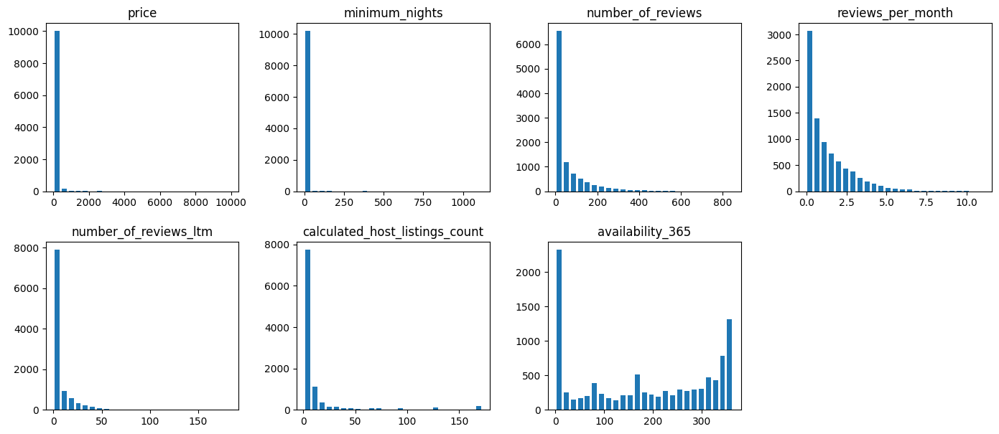

In [ ]:
# plotting the histogram of numerical variables
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'number_of_reviews_ltm',
    'calculated_host_listings_count', 'availability_365']].hist(bins=25, figsize=(17,7), grid=False, layout=(2, 4), rwidth=0.7);

Some important observations can be seen from these graphs:

* The variables `price` and `minimum_nights` concentrate most of their values ​​close to zero; however, although it cannot be seen, the values ​​extend up to €10,000 and a minimum reservation of 1,000 nights, respectively. These extreme values, even if in small quantities, distort the statistical calculations, as will be shown below, and can lead to erroneous conclusions.

* `number_of_reviews`, `reviews_per_month` and `number_of_reviews_ltm` have similar distributions, since they correspond to the same aspect, the reviews, and are highly correlated (the degree of correlation between these three variables will be presented later). Although it is not common, it is not strange for some properties to have 800 reviews in total or 150 reviews in the last year; it is also not surprising that the majority have few or no reviews.

* It is also expected that almost all owners will only have one or a few properties advertised; The fact that there are owners with more than fifty (some even more than 150!) is impressive. It is unlikely - but not impossible - that these hosts actually own all of these properties, unless they are multiple rooms in the same hotel, for example. It is more likely that these hosts are, in fact, tenants! [Some websites](https://hospitable.com/rental-arbitrage/) on the Internet teach a way to rent a house for a few months and then make it available on Airbnb, profiting from the difference between what you receive from reservations and what you spend on conventional rent; it is, in a way, a form of leverage, since you can earn an income from hosting without owning the property.

* The distribution of booking availability for the next year is, in a sense, a mirror of the review graphs: rooms tend to be concentrated around 365 (i.e., total availability) and as they are booked, the best ones with higher frequency, they spread out along the axis. The caveat is exactly at point zero: is it reasonable that more than two thousand properties are fully booked for the next year, especially considering that this is the third year of a global pandemic, which is not expected to end any time soon? The greater chance is that hosts have blocked the possibility of booking, for whatever reason (including, of course, the pandemic). One could investigate the common characteristics of these properties, if any, to find more information on this subject; however, this is not the focus of this work.

Now that the outliers have been identified qualitatively, they will be measured quantitatively.

### **Outliers**

Extreme values, far from what is expected, hinder analyses and lead to erroneous conclusions. But, statistically, what are their effects?

Below are some statistical data for the variables observed above. In order:
* **number** of entries;
* **mean**;
* **standard deviation**;
* **minimum** value found;
* point value in the **first quartile** (25% of the values ​​are below and 75% above);
* **median**;
* value in the **third quartile**;
* **maximum** value.

In [ ]:
# viewing the statistical summary of the numerical variables
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'number_of_reviews_ltm',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,number_of_reviews_ltm,calculated_host_listings_count,availability_365
count,10268.000000,10268.000000,10268.000000,8426.000000,10268.000000,10268.000000,10268.000000
mean,123.433093,4.418972,52.487826,1.307718,5.790612,11.442540,181.939521
std,327.243201,27.853611,85.455781,1.420227,11.199432,28.093065,136.612573
min,0.000000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000
25%,55.000000,1.000000,2.000000,0.250000,0.000000,1.000000,29.000000
50%,79.500000,2.000000,14.000000,0.810000,0.000000,2.000000,183.000000
75%,119.000000,3.000000,66.000000,1.930000,6.000000,7.000000,320.000000
max,9999.000000,1120.000000,850.000000,11.090000,184.000000,172.000000,365.000000


The average of prices, minimum nights booked and number of properties from the same host are higher than at least **75% of the properties** analyzed in the dataset (more than 95% in the cases of `price` and `minimum_nights`, to be precise), due to the very high maximum values.<br>
For reviews' total number, per month and in the last 12 months, the average is close to the third quartile and far from the median, also due to high maximum values, but not so much.<br>
The variable `number_of_reviews_ltm` also brings a particularity, which is the fact that more than 50% of the properties did not have any reviews in the last year. There are two most likely explanations:

1. Due to the pandemic, fewer people traveled to Florence (in fact, to any place); no tourists, no guests, no reviews.
1. Few people review the products and services they purchase, not only on Airbnb; it may therefore be a general and timeless characteristic of human beings.

The mean of `availability_365` is almost equal to the median, but more because of the limited range (from 0 to 365) than because it is a common distribution, unlike the other variables, whose maximum is undetermined. In fact, the first quartile point corresponds to around 8% of the scale, and the third quartile point corresponds to 87%.

Another way to see this information graphically is through the *box plot*. It is interpreted as follows:

<img alt="Box plot" width="700 px" src="https://raw.githubusercontent.com/wagnerscerqueira/analise_airbnb_florenca/main/img/Boxplot.webp">

- the center line indicates the *median*;
- the two limits of the box indicate the *first and third quartiles*, respectively; This range is called the interquartile range (IQR);
- the two lines at the ends of the diagram indicate the minimum and maximum limits, which can be:
  - the minimum and maximum values ​​of the data analyzed; or
  - the first quartile minus one and a half times the interquartile range, and the third quartile plus 1.5x IQR. Technically, the IQR can be multiplied by any real number; the factor of 1.5 is the most commonly used because it can encompass more than 99% of the data within a normal (Gaussian) distribution below or above the median. By this criterion, any data beyond these limits is considered an outlier.

Below are the box plots of the three main variables: `price`, `minimum_nights` and `availability_365`:

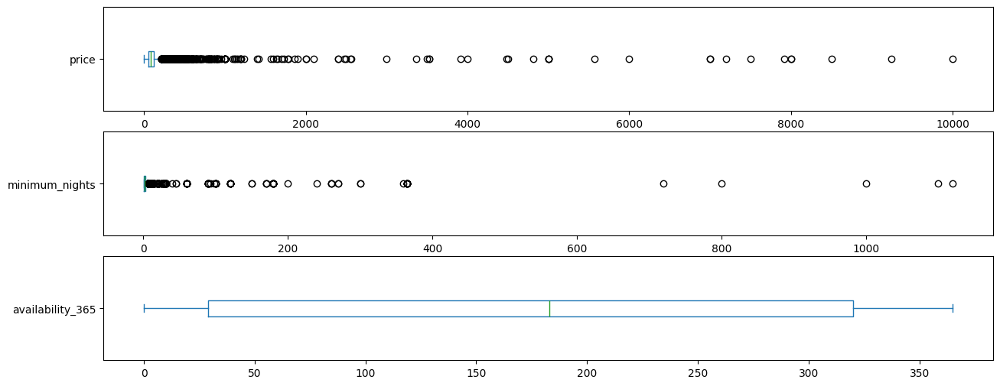

In [ ]:
# box plot of 'price', 'minimum_nights' and 'availability_365'
df.plot(subplots=True, y=['price', 'minimum_nights', 'availability_365'],
    kind='box', vert=False, figsize=(15, 6), layout=(3,1), sharex=False);

The size of the price and minimum nights boxes reflects the extent of the distortion caused by the outliers (`minimum_nights` is, in fact, just one line). The `availability_365` diagram, although it does not contain any values ​​outside the limits - due to the restricted scale, already presented above -, is also distorted: the amount of data inside and outside the box is the same, 50% of the total set, but they represent very different proportions of the scale, 80% and 20%, respectively.

The quantity and proportion of *outliers*, for `price` and `minimum_nights`, and of zero availability, for `availability_365`, are presented below to demonstrate that so few data that are extremely divergent from the others can cause effects such as those shown above. The cut-off value is the third quartile data plus 1.5 times the interquartile range, or the number of zeros:

In [ ]:
# amount of values ​​above 215 for price
print("Quantity and proportion of outliers for price:")
print("{} entries".format(len(df[df.price > 215])))
print("{:.2f}%\n".format((len(df[df.price > 215]) / df.shape[0])*100))

# amount of values ​​above 6 days for minimum_nights
print("Quantity and proportion of outliers for minimum_nights:")
print("{} entries".format(len(df[df.minimum_nights > 6])))
print("{:.2f}%\n".format((len(df[df.minimum_nights > 6]) / df.shape[0])*100))

# amount of values ​​equal to 0 for availability_365
print("Quantity and proportion of values ​​equal to 0 for availability_365:")
print("{} entries".format(len(df[df.availability_365 == 0])))
print("{:.2f}%".format((len(df[df.availability_365 == 0]) / df.shape[0])*100))

Quantity and proportion of outliers for price:
814 entries
7.93%

Quantity and proportion of outliers for minimum_nights:
514 entries
5.01%

Quantity and proportion of values ​​equal to 0 for availability_365:
1968 entries
19.17%


To raise the mean above the third quartile, to place 50% of the total data in just 20% of the scale, only 8%, 5%, 19% of radically different values ​​are needed:

- the maximum value of `price`, €9999, is 46.5 times greater than the maximum limit of the box plot, €215;
- the maximum of `minimum_nights`, 1,120 nights, equivalent to 3 years and 25 days, is 186.7 times greater than the limit, 6 nights;
- 19% of the properties are concentrated in 0.27% of the `availability_365` scale (1/366).

The outliers have already been detected and measured; the next step is to remove them to adapt the dataset to the situation addressed in this project: a person who wants to spend their vacations in Florence. The following data will be removed:

1. properties whose `minimum_nights` is greater than 30, the maximum period that the hypothetical person could stay;
1. properties with zero availability, which are already booked for the entire next year or are blocked for new reservations;
1. properties with a price higher than €750, which corresponds to approximately 1% of the total; this considerably reduces the distortion caused by outliers, without losing relevant information or artificially reducing the average property price;
1. the entire `neighbourhood_group` and `license` columns, as they do not contain any useful data, as presented at the beginning of the project.

In [ ]:
# removing outliers in a new DataFrame to suit the hypothetical situation
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.availability_365 == 0].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.price > 750].index, axis=0, inplace=True)

# removing 'neighbourhood_group' and 'license'
df_clean.drop(columns=['neighbourhood_group', 'license'], inplace=True)

For comparison, the histograms, statistical summary and box plots will be shown below, in order to check the difference before and after removal:

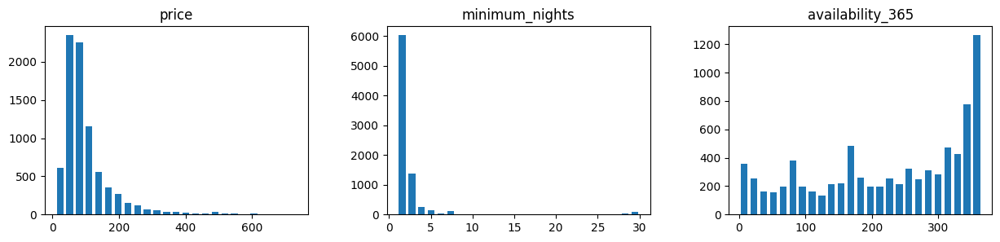

In [ ]:
# histogram of 'price', 'minimum_nights' and 'availability_365'
df_clean[['price', 'minimum_nights', 'availability_365']].hist(bins=25, figsize=(15,3), grid=False, rwidth=0.7, layout=(1,3));

The distribution of `price`, `minimum_nights` and `availability_365` has become much more coherent; one can see more clearly the price concentration in the range between €50 and €100.

In [ ]:
# statistical summary of 'price', 'minimum_nights' and 'availability_365'
df_clean[['price', 'minimum_nights', 'availability_365']].describe()

,price,minimum_nights,availability_365
count,8147.000000,8147.000000,8147.000000
mean,102.598134,2.569044,225.146680
std,80.562556,3.763998,115.497517
min,9.000000,1.000000,1.000000
25%,57.000000,1.000000,134.000000
50%,80.000000,2.000000,250.000000
75%,118.000000,3.000000,336.000000
max,736.000000,30.000000,365.000000


The dataset has reduced by about 20.6%; the standard deviation of the main variables has decreased dramatically, meaning that the variation of values ​​in these columns has become smaller, and the means have converged closer to the median.

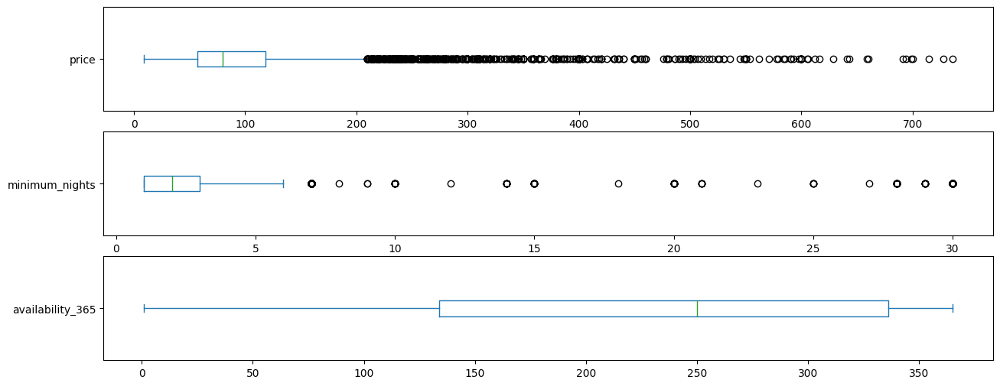

In [ ]:
# box plot of 'price', 'minimum_nights' and 'availability_365'
df_clean.plot(subplots=True, y=['price', 'minimum_nights', 'availability_365'],
 kind='box', vert=False, figsize=(15, 6), layout=(3,1), sharex=False);

Despite there still being a lot of data outside the diagram, the information is much clearer; where before there was just one line, in `price` and `minimum_nights`, you can now see the median and interquartile range. The distribution of values ​​for `availability_365` seems to make more sense, with approximately half of the data in each half of the scale.

Before proceeding to analyze the situation and the insights that can be generated, lastly, we will evaluate the correlation between the variables.

### **Correlation**

[Correlation](https://conceito.de/correlacao) is the term used to describe the reciprocal or corresponding relationship that exists between two or more elements. The concept is used in different ways, depending on the context.

In the field of mathematics and statistics, correlation refers to the proportionality and linear relationship that exists between different variables. If the values ​​of one variable are systematically modified in relation to the values ​​of another, the two variables are said to be correlated.

Below is the correlation matrix between the different variables in the dataset, and also the *heatmap* to facilitate the visualization of these correlations; the darker the shade of blue, the greater the positive correlation; the darker the red, the greater the negative correlation, that is, the variables are inversely correlated (when one increases, the other decreases). White indicates no correlation.

,price,minimum_nights,number_of_reviews,reviews_per_month,number_of_reviews_ltm,calculated_host_listings_count,availability_365
price,1.000000,-0.026828,-0.149935,-0.158273,-0.150077,0.077669,0.049307
minimum_nights,-0.026828,1.000000,-0.066420,-0.113259,-0.100105,-0.033358,-0.052186
number_of_reviews,-0.149935,-0.066420,1.000000,0.709491,0.536725,-0.120047,-0.013546
reviews_per_month,-0.158273,-0.113259,0.709491,1.000000,0.741844,-0.099940,-0.002506
number_of_reviews_ltm,-0.150077,-0.100105,0.536725,0.741844,1.000000,-0.065250,0.007990
calculated_host_listings_count,0.077669,-0.033358,-0.120047,-0.099940,-0.065250,1.000000,0.027160
availability_365,0.049307,-0.052186,-0.013546,-0.002506,0.007990,0.027160,1.000000


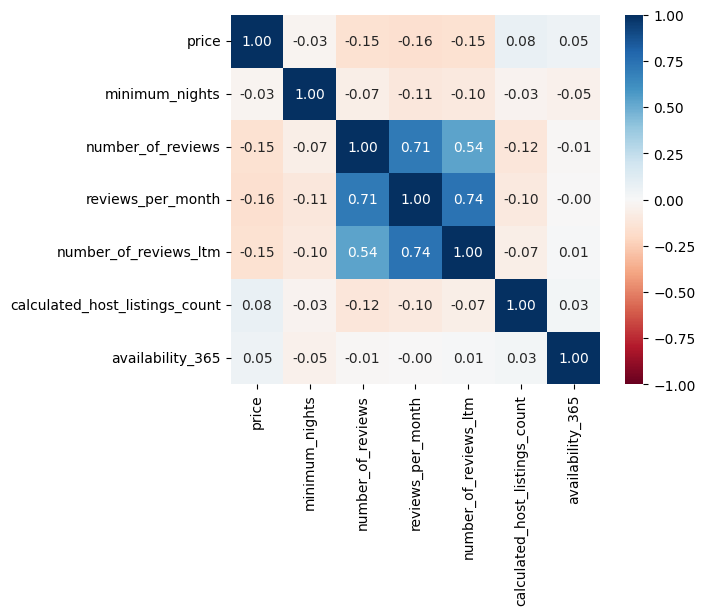

In [ ]:
# creating a correlation matrix
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
'number_of_reviews_ltm', 'calculated_host_listings_count', 'availability_365']].corr()

# displaying the correlation matrix
display(corr)

# plotting a heatmap from the correlations
sns.heatmap(corr, vmin=-1.0, vmax=1.0, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

As already anticipated, the greatest correlations are between the variables associated with reviews; the other variables have a neutral or negative correlation.

The slightly orange zone around the blue center is noteworthy, indicating that `price`, `minimum_nights` and `calculated_host_listings_count` have a low negative correlation with `number_of_reviews`, `reviews_per_month` and `number_of_reviews_ltm`, ranging from -7% to -16%. The interpretation, for price and minimum nights for booking, is intuitive: the lower the price and the shorter the minimum period for staying, the more people will want (and be able) to stay in that room, enabling a greater number of reviews. In the case of the number of properties per owner, the explanation is not so intuitive; after all, the more rooms a host has available for booking, the more reviews they will receive, right?

Yes, <ins>*for the host*</ins>, not for the room. The fact that a property is owned by a person who owns a hundred other properties does not in any way influence the number of reviews it will have, nor does it mean that it is more likely to be reviewed than one that is the only property owned by someone. On the contrary: a high number of properties increases the chance that the host will have zero reviews for at least one property (it has been shown that 25% of properties have two or fewer reviews).

The variable `calculated_host_listings_count` is a characteristic of the host, not the property; however, the entries represent the properties; therefore, properties that belong to the same owner share the same value for `calculated_host_listings_count`. Considering that a large portion of rooms have few or no reviews and that most hosts only own one property, it is understandable that the number of reviews for a room remains low even for those whose owners own several properties.

The correlation, it is concluded, is slightly negative, but *this does not imply **causality**!* The two variables, `calculated_host_listings_count` and `number_of_reviews` (and also the others associated with the reviews) are independent and do not influence each other; the indication of negative correlation is just a coincidence. It is the analyst's role to know how to distinguish correlation and causality so that the analysis is accurate.

## **Analysis of the Situation**

Once the exploratory data analysis steps have been completed, in which the **structure** of the dataset, **volume and types** of data, quantity of **missing values**, **distribution** of variable values, **detection and removal** of outliers and the **correlation** between variables have been verified, we can proceed to the analysis of the hypothetical situation.

Here we seek answers to some questions that may be asked by someone interested in traveling to Florence for their vacation:
- What is the average price to stay on Airbnb?
- Which district is the most expensive and which is the cheapest?
- Which room types are most available and what is the price difference between them?

### **Average prices**

The average price of the city is the expected cost of accommodation and serves as a parameter to evaluate the difference in prices of the districts in relation to the rest of the city.

In [ ]:
# seeing the average price in the city
city_mean_price = df_clean.price.mean()
print('Average price in Florence per night: €{:.2f}'.format(city_mean_price))

Average price in Florence per night: €102.60


### **Districts**

The municipality of Florence is subdivided into five administrative districts (*Quartieri*). Each district is governed by a Council (*Consiglio*) and a President, elected at the same time as the Mayor of the city. The districts have the power to advise the Mayor with non-binding opinions on a wide range of topics (environment, construction, public health, local markets) and to carry out the functions delegated to them by the City Council; they also have an independent budget to finance local activities. The districts are:

- Centro Storico;
- Campo di Marte;
- Gavinana-Galluzzo;
- Isolotto-Legnaia;
- Rifredi.

Below is information about room distribution by district:

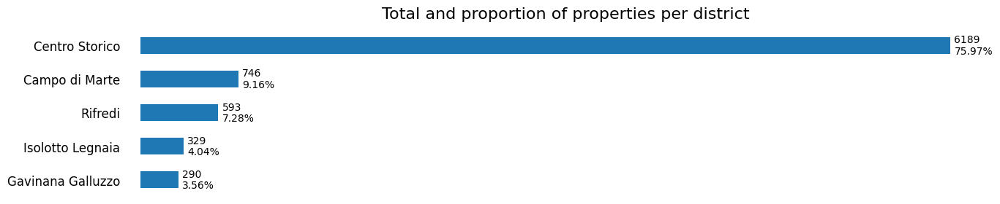

In [ ]:
# creating chart
ax = df_clean.neighbourhood.value_counts().sort_values(ascending=True).plot.barh(figsize=(15, 3))

# formatting chart
ax.set_title('Total and proportion of properties per district', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 6500)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
 ax.text(rect.get_width() + 30,
 rect.get_y() + rect.get_height()*5/6,
 '{}'.format((rect.get_width())),
 va='center')
 ax.text(rect.get_width() + 30,
 rect.get_y() + rect.get_height()/6,
 '{:.2f}%'.format((rect.get_width()/df_clean.shape[0]*100)),
 va='center')

Three-quarters of the properties advertised on Airbnb in Florence are in the Historic Center; This amount is justified by the proximity to the city's main tourist attractions.

The average prices by district and the difference compared to the city average are as follows:

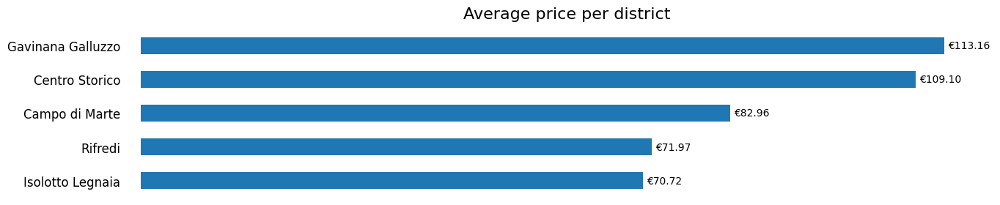

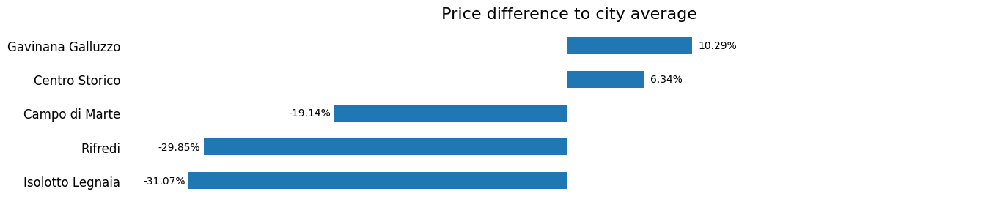

In [ ]:
# creating first chart
ax = df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatting chart
ax.set_title('Average price per district', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 120)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
  ax.text(rect.get_width() + 0.5,
          rect.get_y() + (rect.get_height() / 2),
          '€{:.2f}'.format((rect.get_width())),
          va='center')

plt.show();

# creating second chart
ax = df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatting chart
ax.set_title(' Price difference to city average', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(-35, 35)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
  rect.set_width(rect.get_width()/city_mean_price * 100 - 100)
  if rect.get_width() > 0:
    x = rect.get_width() + 0.5
  else:
    x = rect.get_width() - 3.75
  ax.text(x,
          rect.get_y() + (rect.get_height() / 2),
          '{:.2f}%'.format((rect.get_width())),
          va='center')

plt.show();

The Gavinana-Galluzzo district is the most expensive, costing an average of €113.16; Isolotto-Legnaia is the cheapest district, €70.72. It is noteworthy that the Historic Center of Florence is only 6.34% more expensive than the city average, considering that this district is home to many of the city's tourist attractions, such as the Cathedral of Santa Maria del Fiore, Ponte Vecchio, the Basilica of Santa Croce, Pitti Palace and several museums.

### **Room Types**

In addition to the price, it is important to know what types of accommodation are available, since not everyone would be comfortable sharing a room or even a living room and kitchen with other people. Here are the numbers of each type of room in Florence:

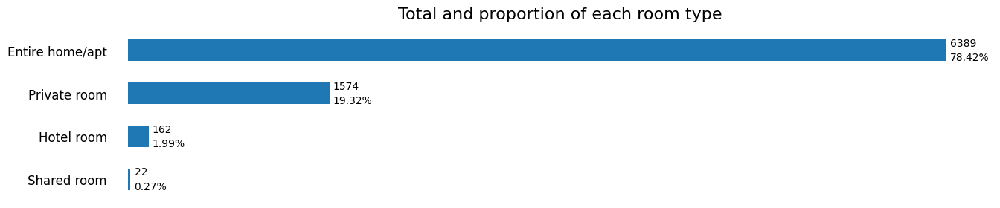

In [ ]:
# creating chart
ax = df_clean.room_type.value_counts().sort_values(ascending=True).plot.barh(figsize=(15, 3))

# formatting chart
ax.set_title('Total and proportion of each room type', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 6750)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()*5/6,
          '{}'.format((rect.get_width())),
          va='center')
  ax.text(rect.get_width() + 30,
          rect.get_y() + rect.get_height()/6,
          '{:.2f}%'.format((rect.get_width()/df_clean.shape[0]*100)),
          va='center')

Almost all properties advertised are of the Entire Home or Private Room type, each with a different degree of privacy. The average prices for each type are as follows:

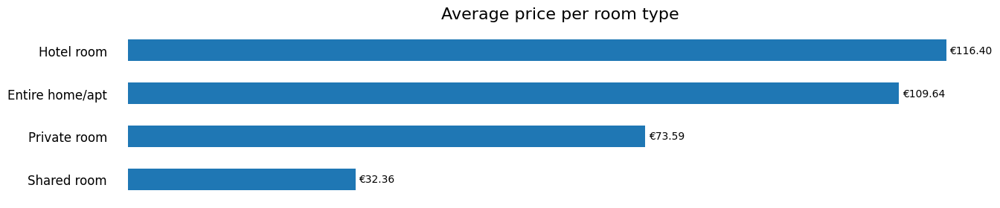

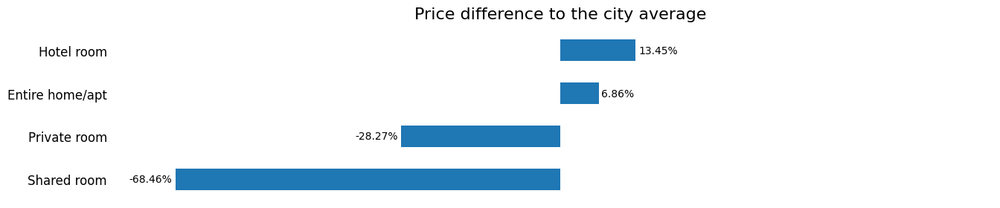

In [ ]:
# creating first chart
ax = df_clean.groupby(['room_type']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatting chart
ax.set_title('Average price per room type', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(0, 123)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
  ax.text(rect.get_width() + 0.5,
          rect.get_y() + (rect.get_height() / 2),
          '€{:.2f}'.format((rect.get_width())),
          va='center')
plt.show();

# creating second chart
ax = df_clean.groupby(['room_type']).price.mean().sort_values(ascending=True).plot.barh(figsize=(15,3))

# formatting chart
ax.set_title('Price difference to the city average', loc='center', pad=10, fontdict={'fontsize': 16})
ax.set_frame_on(False)
ax.set_ylabel('')
ax.set_xlim(-77, 77)
ax.get_xaxis().set_visible(False)
ax.tick_params(axis='y', length=0, labelsize=12, pad=20)

# inserting labels
for rect in ax.patches:
  rect.set_width(rect.get_width()/city_mean_price * 100 - 100)
  if rect.get_width() > 0:
    x = rect.get_width() + 0.5
  else:
    x = rect.get_width() - 8.25
  ax.text(x,
          rect.get_y() + (rect.get_height() / 2),
          '{:.2f}%'.format((rect.get_width())),
          va='center')

plt.show();

Hotel rooms are 13.45% more expensive than the city average. For total privacy while giving up certain amenities, you can stay in an Entire Home for an average of €109.64. The biggest discounts are on Shared Rooms and Private Rooms (parts of the house are shared), with 68.46% and 28.27% off, respectively.

### **Location of properties**

These informations are already sufficient to help tourists who want to visit Florence: average prices for the city and each district, number of spaces available for each type of room and their respective average prices. However, it will make decision-making much easier for tourists to know exactly where the cheapest and most expensive properties are on a map.

Below is an interactive map with the markings for each advertised property. The yellow circles are the rooms whose price is up to 10% above or below the city average; the green and red circles, in turn, are the rooms whose price is below or above this range. By clicking on the circles, the price of the corresponding property will be shown in a popup.

In [ ]:
# creating map
m = folium.Map(location=[43.77238,11.25395], zoom_start=13, prefer_canvas=True,
               min_lat=43.726430, max_lat=43.837323, min_lon=11.159770, max_lon=11.336160, max_bounds=True)

# data structure containing latitude, longitude and property price
lat = []
lon = []
price = []
data = {'lat': lat, 'lon': lon, 'price': price}

for room in range(0, df_clean.shape[0]):

  # inserting property information into the data structure
  lat.append(df_clean.latitude.values[room])
  lon.append(df_clean.longitude.values[room])
  price.append(df_clean.price.values[room])

  # green color for properties cheaper than 90% of the city's average price
  if data['price'][room] < 0.9 * city_mean_price:
    color = '#008000'

  # red color for properties more expensive than 110% of the city's average price
  elif data['price'][room] > 1.1 * city_mean_price:
    color = '#FF0000'

  # yellow color for properties up to 10% above or below the city's average price
  else:
    color = '#FFFF00'

  # adding property to map
  folium.CircleMarker(
    location=[data['lat'][room], data['lon'][room]],
    radius=2,
    weight=2,
    opacity=0.8,
    color=color,
    fill_opacity=0.7,
    fill=True,
    popup=('€{}'.format(str(data['price'][room])))
    ).add_to(m)

# displaying map
m

Although slightly more expensive than the city average, it is possible to find several cheap rooms in the *Centro Storico* and be close to some of the most fascinating tourist attractions in the world, even if only for a few days. As it is home to the majority of properties advertised on Airbnb in Florence, this district has options for all budgets and tastes.

## ** Conclusion **

Even with a simple analysis and without using the complete data set, it was possible to draw deep conclusions. The actions carried out in this project include:

- import and verification of the dataset (number of entries and variables, and variable types);
- quantification of missing values;
- distribution of variables and preliminary identification of *outliers*;
- investigation and removal of *outliers*;
- verification of the correlation between variables;
- analysis of the hypothetical situation, in which the following were explored:
  - average price of the city of Florence;
  - number and average price of rooms by district;
  - number and average price by room type;
  - location of advertised properties.

The quantity and quality of *insights* can be considerably increased by using the complete set, which will be left for a future project.

Thank you for your attention!
<br><br>

---

Follow me on social media:<br>
[LinkedIn](https://www.linkedin.com/in/wagnerscerqueira/) |
[Medium](https://medium.com/@wagnerscerqueira) |
[Github](https://github.com/wagnerscerqueira/data-science)